In [ ]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from sklearn.metrics.pairwise import linear_kernel
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.tokenize import RegexpTokenizer
import re
import string
import random
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models import Word2Vec
from gensim.models.phrases import Phrases, Phraser
from matplotlib import pyplot
from gensim.models import KeyedVectors
# import wget

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
df = pd.read_csv("flipkart selected columns.csv", encoding='utf-8')


In [ ]:
df=df.sample(n=5000, random_state=1)

In [ ]:
pattern = r'(https?:\/\/(?:www\.)?[-a-zA-Z0-9@:%._+~#=]{1,256}\.[a-zA-Z0-9()]{1,6}[-a-zA-Z0-9()@:%_+.~#?&/=]*)'

In [ ]:
# df['links'] = ''
df['links']= df["image"].str.extract(pattern, expand=True)

In [ ]:
df


,product_name,retail_price,image,description,links
11456,"Solah Shringar Brass, Lac Bangle Set",1299.0,"[""http://img5a.flixcart.com/image/bangle-brace...","Solah Shringar Brass, Lac Bangle Set - Buy Sol...",http://img5a.flixcart.com/image/bangle-bracele...
16528,Tinted Full Sleeve Solid Men's Sweatshirt,1495.0,"[""http://img6a.flixcart.com/image/sweatshirt/p...",Tinted Full Sleeve Solid Men's Sweatshirt - Bu...,http://img6a.flixcart.com/image/sweatshirt/p/f...
3253,SHOPMANIA DESIGNER NOTEBOOK A5 Notebook Spiral...,499.0,"[""http://img5a.flixcart.com/image/diary-notebo...",Specifications of SHOPMANIA DESIGNER NOTEBOOK ...,http://img5a.flixcart.com/image/diary-notebook...
18614,Neon Cotton Embroidered Multi-purpose Fabric,1730.0,"[""http://img5a.flixcart.com/image/fabric/s/e/a...",Key Features of Neon Cotton Embroidered Multi-...,http://img5a.flixcart.com/image/fabric/s/e/a/n...
1544,Silver Bucks Camouflage Cargo Men's Cargos,1695.0,"[""http://img5a.flixcart.com/image/cargo/y/t/c/...",Silver Bucks Camouflage Cargo Men's Cargos - B...,http://img5a.flixcart.com/image/cargo/y/t/c/ca...
...,...,...,...,...,...
14011,Ocean Race Graphic Print Men's Round Neck T-Shirt,598.0,"[""http://img6a.flixcart.com/image/t-shirt/g/j/...",Ocean Race Graphic Print Men's Round Neck T-Sh...,http://img6a.flixcart.com/image/t-shirt/g/j/q/...
18315,Tappu Ki Dukaan Cotton Apron Free Size,799.0,"[""http://img5a.flixcart.com/image/apron/j/d/f/...",Key Features of Tappu Ki Dukaan Cotton Apron F...,http://img5a.flixcart.com/image/apron/j/d/f/tk...
6338,Juhi Malhotra Ceramic Choker,450.0,"[""http://img6a.flixcart.com/image/necklace-cha...",Juhi Malhotra Ceramic Choker - Buy Juhi Malhot...,http://img6a.flixcart.com/image/necklace-chain...
2444,S4S Stylish Women's Push-up Bra,949.0,"[""http://img5a.flixcart.com/image/bra/j/9/y/pi...",S4S Stylish Women's Push-up Bra\n ...,http://img5a.flixcart.com/image/bra/j/9/y/pihu...


In [ ]:
df=df.drop(['image'], axis=1)

In [ ]:
df.to_csv('df_5000_selected columns.csv', index=False,
          compression=None)  

In [ ]:
#Utitlity functions for removing ASCII characters, converting lower case, removing stop words, html and punctuation from description

def _removeNonAscii(s):
  s=str(s)
  return "".join(i for i in s if  ord(i)<128)

def make_lower_case(text):
    return text.lower()

def remove_stop_words(text):
    text = text.split()
    stops = set(stopwords.words("english"))
    text = [w for w in text if not w in stops]
    text = " ".join(text)
    return text

def remove_html(text):
    html_pattern = re.compile('<.*?>')
    return html_pattern.sub(r'', text)

def remove_punctuation(text):
    tokenizer = RegexpTokenizer(r'\w+')
    text = tokenizer.tokenize(text)
    text = " ".join(text)
    return text

def remove_num(text):
  text2=''
  nums='0123456789'
  for i in text:
    if i in nums:
      i=''
    text2+=i
  return text2

df=df.drop_duplicates(subset=['product_name'])

df['cleaned'] = df['product_name'].apply(_removeNonAscii)

df['cleaned'] = df.cleaned.apply(func = make_lower_case)
df['cleaned'] = df.cleaned.apply(func = remove_stop_words)
df['cleaned'] = df.cleaned.apply(func=remove_punctuation)
df['cleaned'] = df.cleaned.apply(func=remove_html)
df['cleaned'] = df.cleaned.apply(func=remove_num)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
df=df.reset_index(drop=True)


In [ ]:
corpus = df["cleaned"].tolist()


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer


In [ ]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(corpus)
vectorizer.get_feature_names_out()

array(['_brn', '_w', 'aa', ..., 'zovon', 'ztea', 'zyxel'], dtype=object)

In [ ]:
X=X.todense()

In [ ]:
df=df.drop_duplicates(subset=['product_name'])


In [ ]:
# Recommending the Top 5 similar books

def recommendations(product_name):
    
    # Calling the function vectors

    # vectors(df)
    
    # finding cosine similarity for the vectors

    cosine_similarities = cosine_similarity(X)

    # taking the title and book image link and store in new data frame called books
    books = df[['product_name', 'links']]
    #Reverse mapping of the index
    indices = pd.Series(df.index, index = df['product_name']).drop_duplicates()
         
    idx = indices[product_name]
    sim_scores = list(enumerate(cosine_similarities[idx]))
    sim_scores = sorted(sim_scores, key = lambda x: x[1], reverse = True)
    sim_scores = sim_scores[1:20]
    book_indices = [i[0] for i in sim_scores]
    recommend = books.iloc[book_indices]
    for index, row in recommend.iterrows():

        response = requests.get(row['links'])
        img = Image.open(BytesIO(response.content))
        plt.figure()
        plt.imshow(img)
        plt.title(row['product_name'])

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


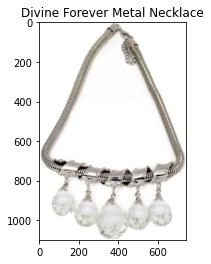

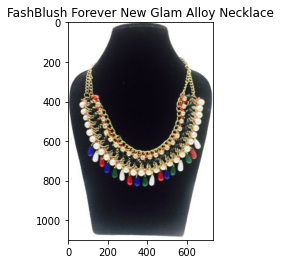

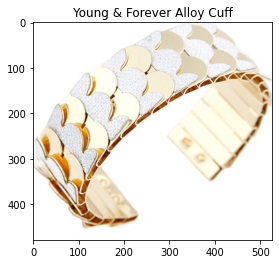

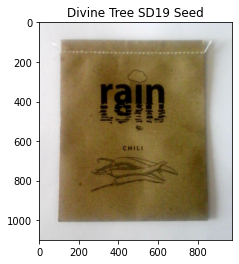

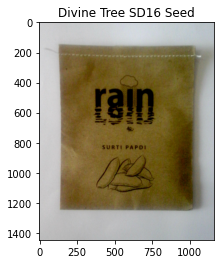

...

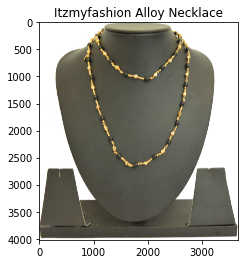

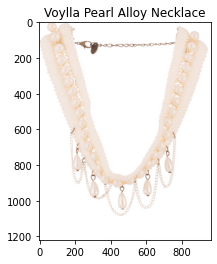

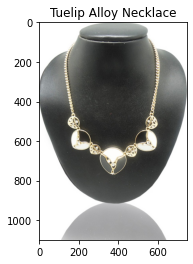

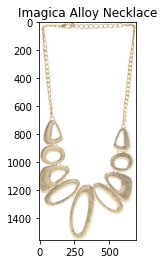

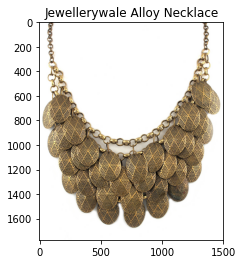

In [ ]:
recommendations("Divine Forever Alloy Necklace")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


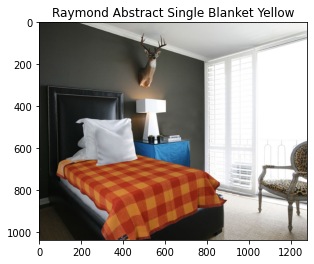

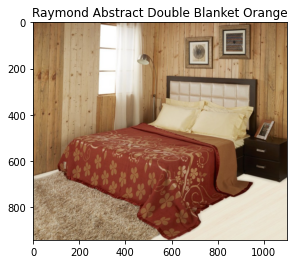

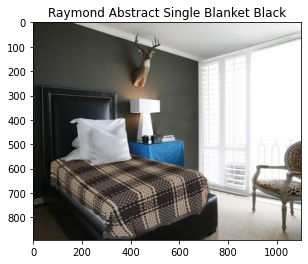

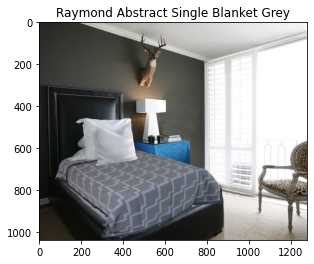

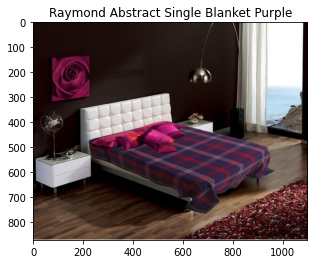

...

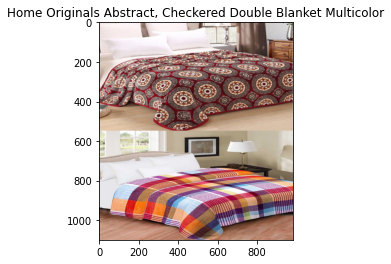

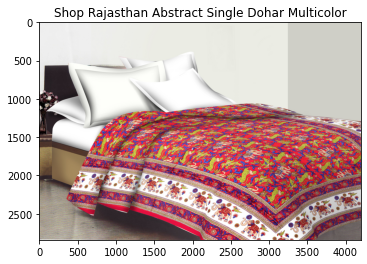

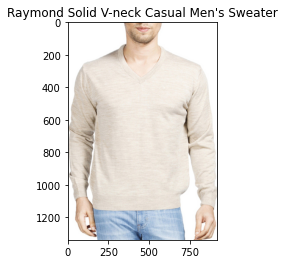

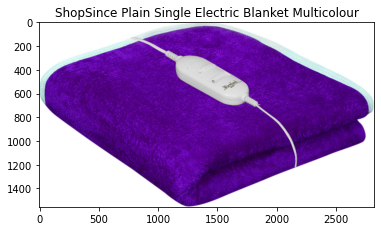

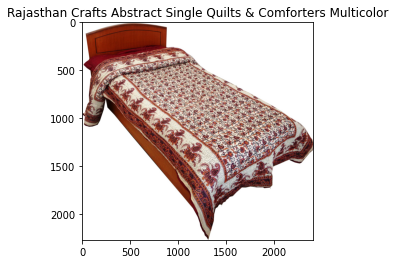

In [ ]:
recommendations("Raymond Abstract Single Blanket Orange")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


UnidentifiedImageError: ignored

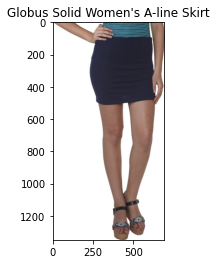

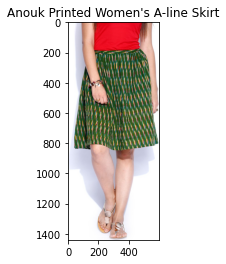

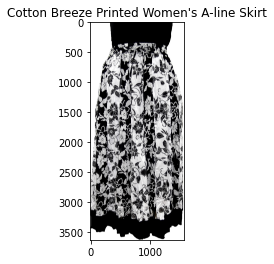

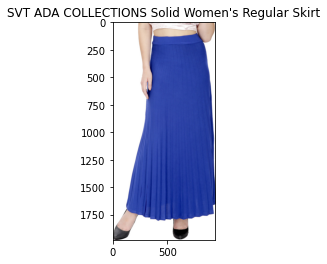

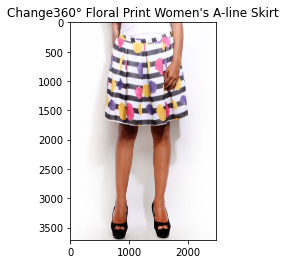

In [ ]:
recommendations("G & M Collections Striped Women's A-line Skirt")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


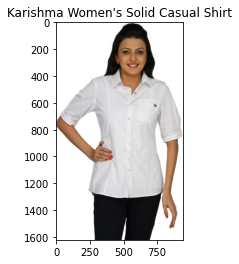

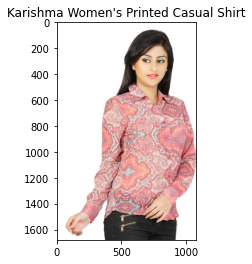

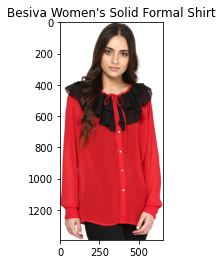

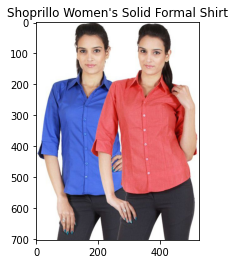

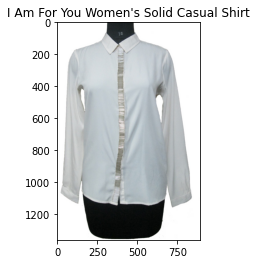

...

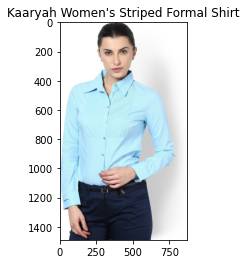

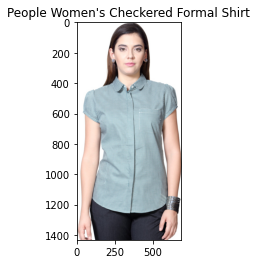

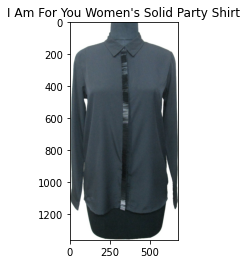

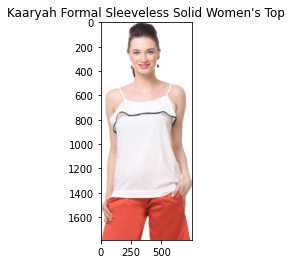

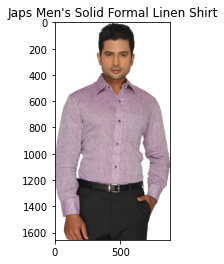

In [ ]:
recommendations("Karishma Women's Solid Formal Shirt")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


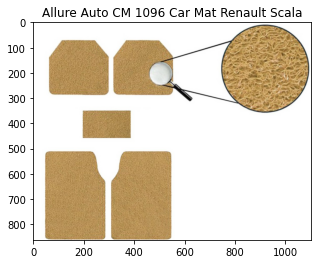

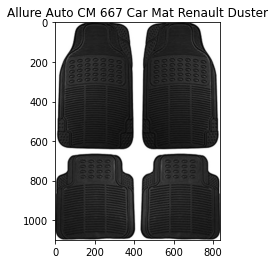

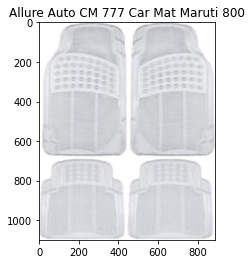

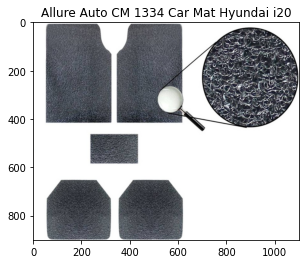

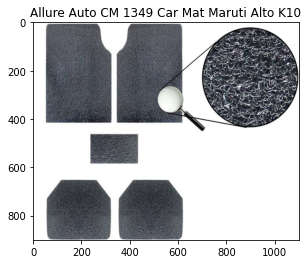

...

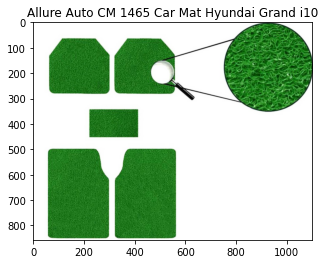

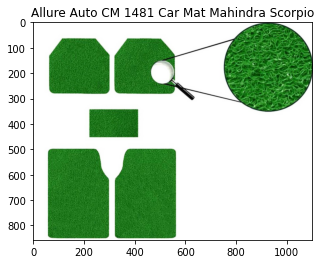

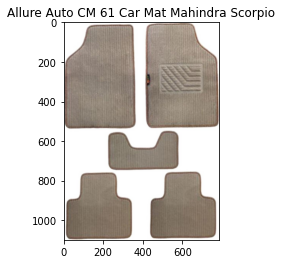

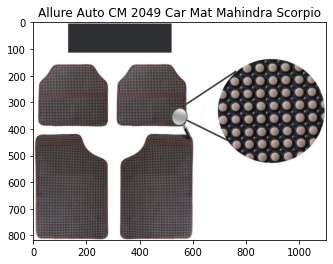

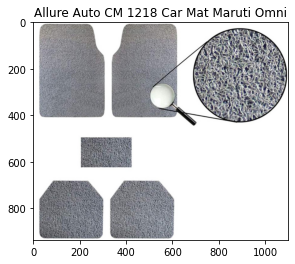

In [ ]:
recommendations("Allure Auto CM 1806 Car Mat Renault Scala")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


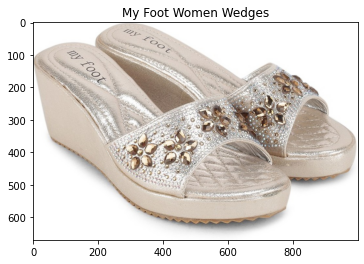

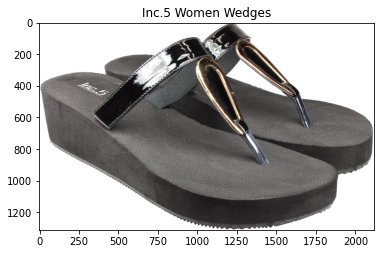

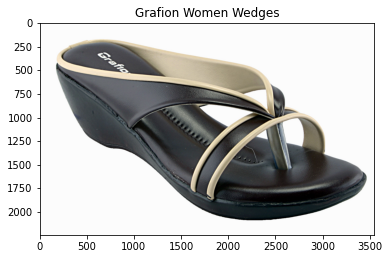

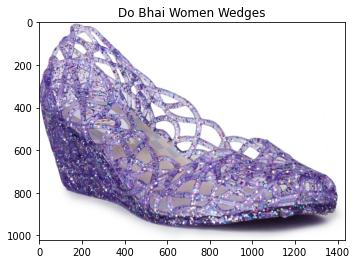

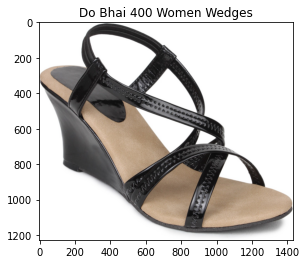

...

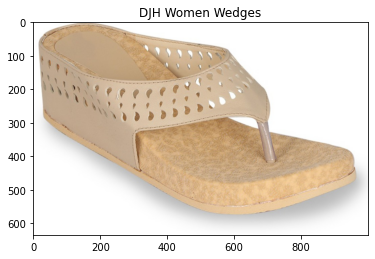

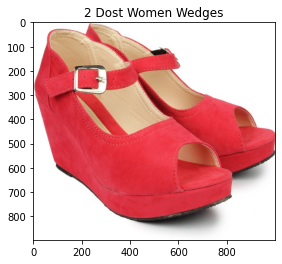

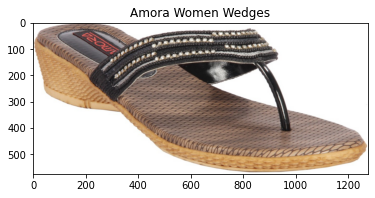

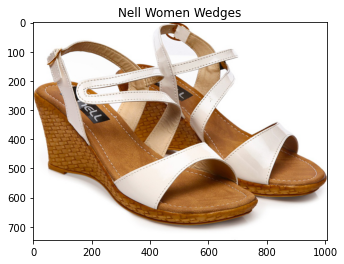

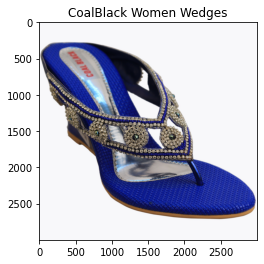

In [ ]:
recommendations("Liza Women Wedges")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


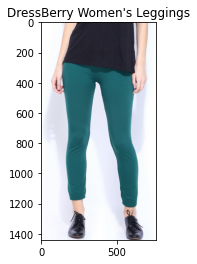

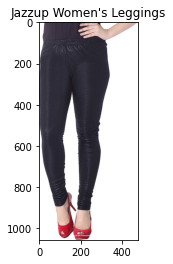

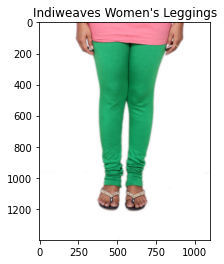

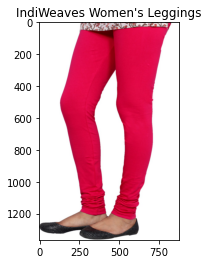

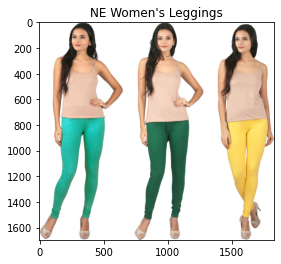

...

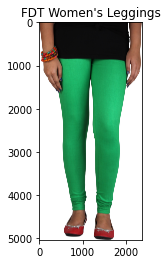

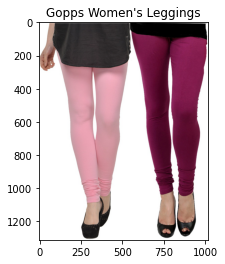

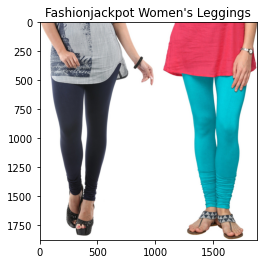

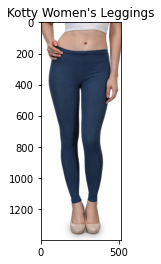

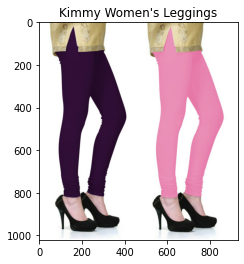

In [ ]:
recommendations("Generation Z Women's Leggings")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


UnidentifiedImageError: ignored

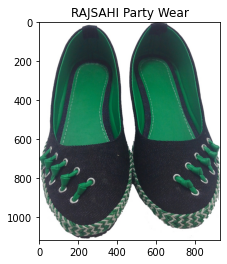

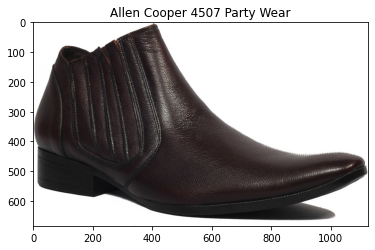

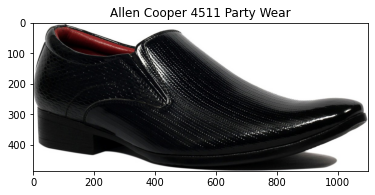

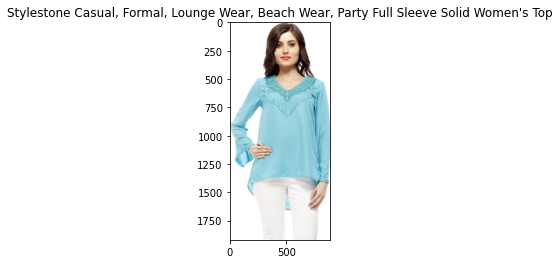

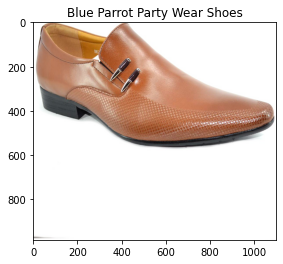

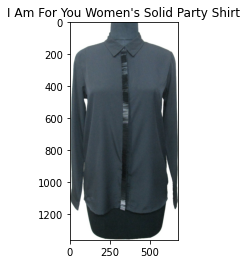

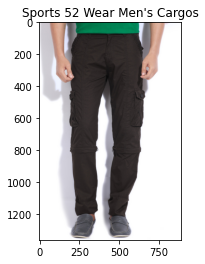

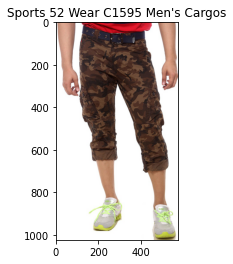

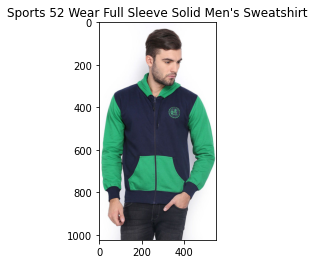

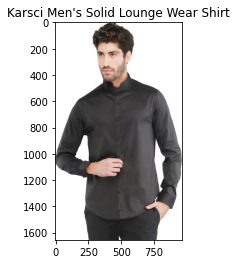

In [ ]:
recommendations("Dorrissini Party Wear")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


UnidentifiedImageError: ignored

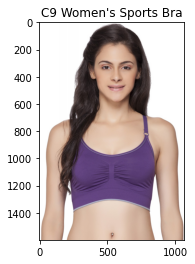

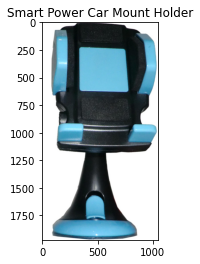

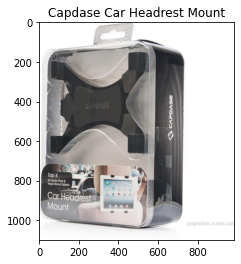

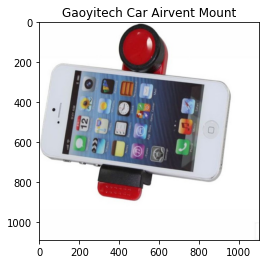

In [ ]:
recommendations("Gear X Sports Mount 2")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


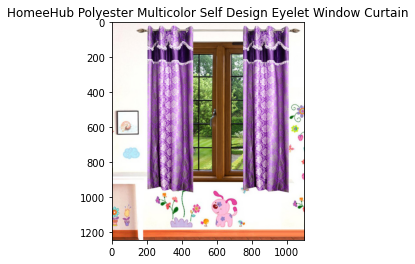

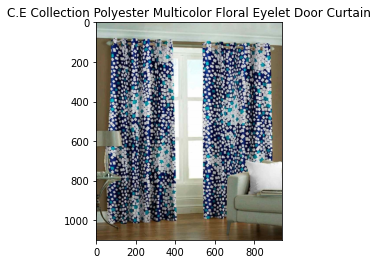

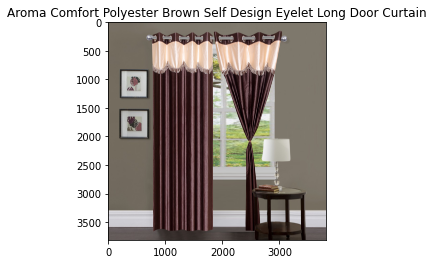

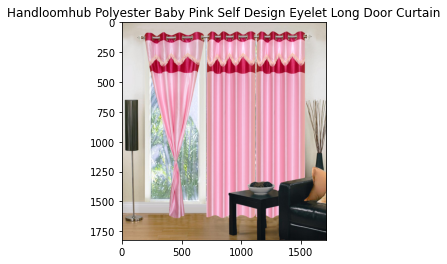

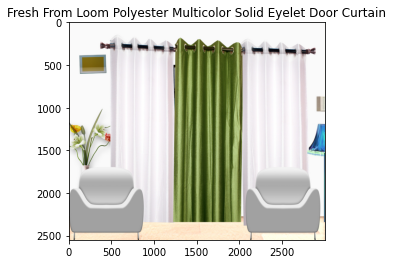

...

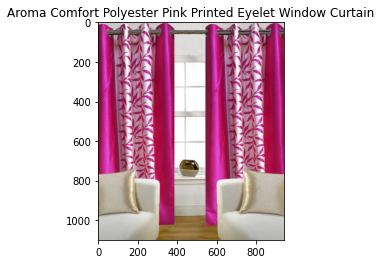

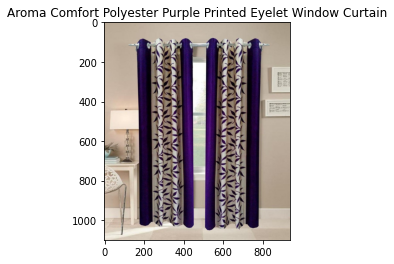

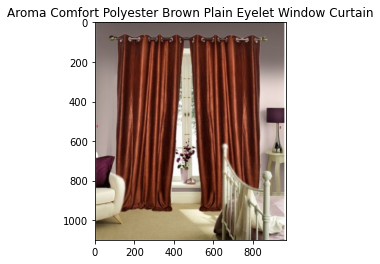

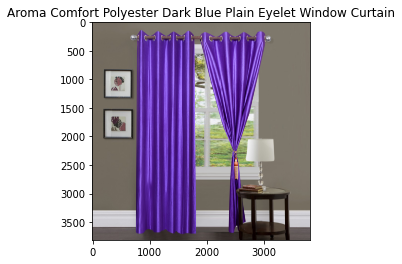

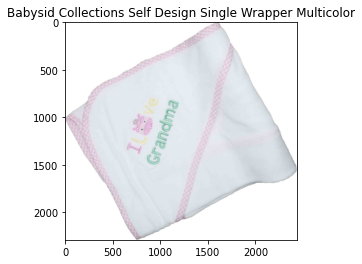

In [ ]:
recommendations("HomeeHub Polyester Multicolor Self Design Eyelet Door Curtain")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


UnidentifiedImageError: ignored

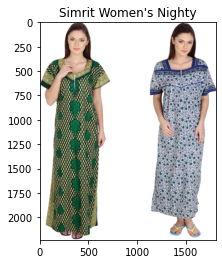

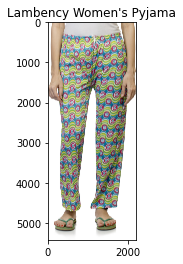

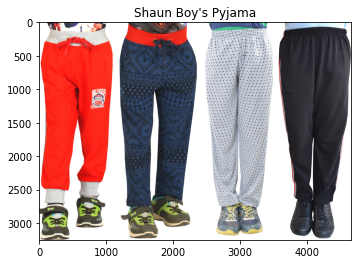

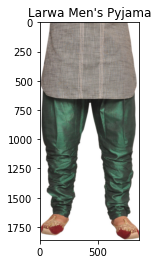

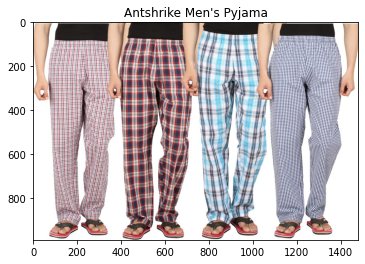

...

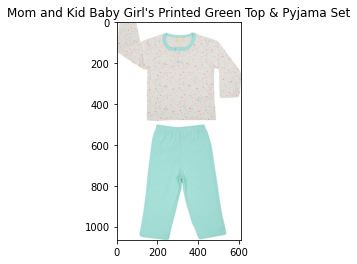

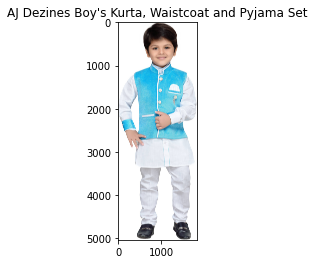

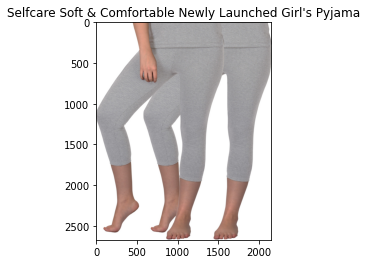

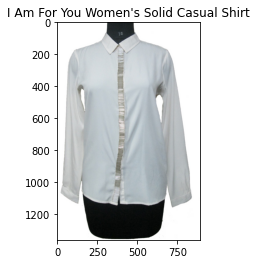

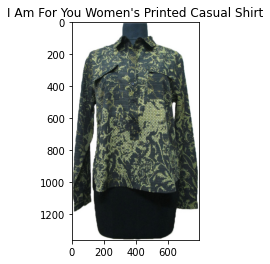

In [ ]:
recommendations("Simrit Women's Pyjama")

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


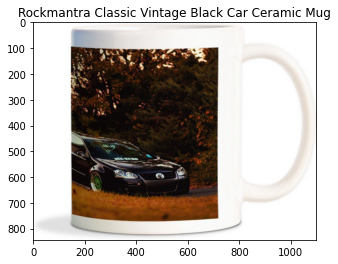

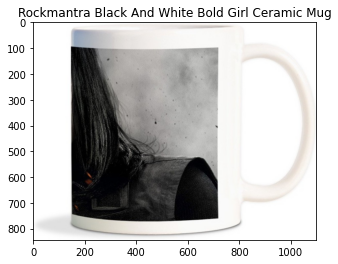

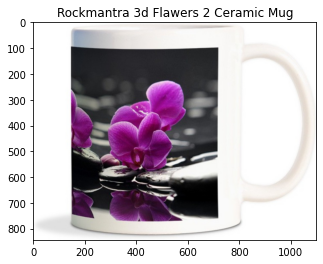

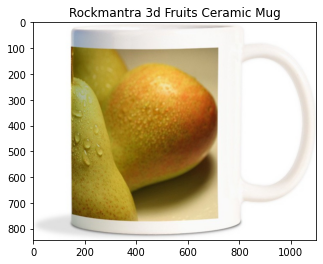

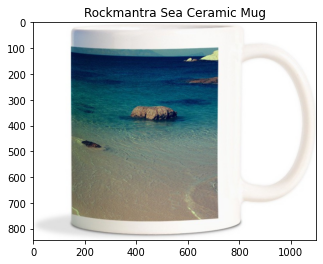

...

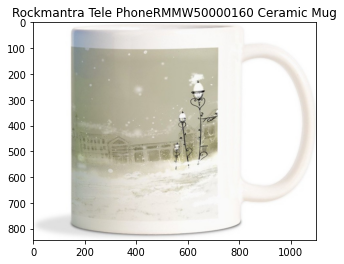

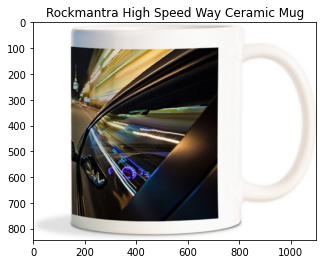

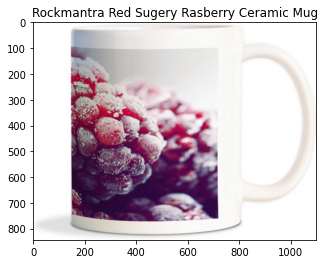

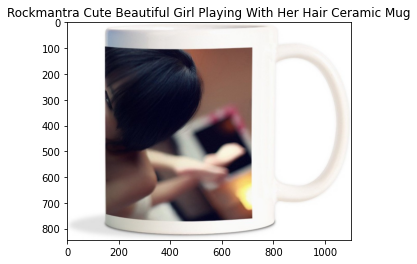

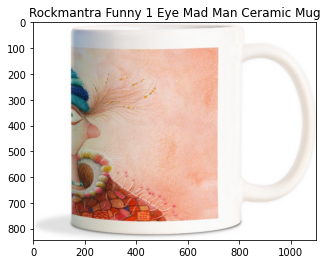

In [ ]:
recommendations("Rockmantra Black Old Batman Car Ceramic Mug")